In [1]:
using Random
using Random123
using Distributions
using Plots
using StatsPlots
using StatsBase
using Statistics
using DataFrames
using Chain
using Dates
using CSV
include("Utils.jl")

initialize_prngs

## 05 Simulating peak-finding on completely uncorrelated landscapes

We now move into the opposite limiting case, where there are no additive effects, and the topography is highly rugged  
We begin with the static case (no genome evolution occurs):

In [2]:
total_population = 1000
σ_epi::Float64 = 1 # standard deviation of the epistatic effects
μ = (total_population^-1)/10 # Mutation rate of the genotypes with some genome. Claudia says than Nμ = 1 is a weird parameter regime, so we adjust it a bit lower
M = 0.0#μ#*10^-1 # There is no genome evolution happening in this case
final_genome = DataFrame(Loci = Int[], Replicate = Int[], Final_fitness = Float64[], Generation = Int[]) # unlike with the additive landscape, there is no trivial way of determining max fitness.
runtime = Dates.format(now(), "yyyymmdd_HHMM")
for i in 1:200
    print("\r$i")
    for test in (1,25,50,75,100) # since no genome evolution, we will treat loci, active_loci, and max_init the same given these sizes
        for generation in (50000) # can test multiple timepoints here
            try
                loci = test
                init_active_loci = test
                max_init_genotype_bits = test
                simulation_length = generation
                rng_default, rng_additive, rng_init_genotype, rng_init_genome, rng_mutation = initialize_prngs(genome_seed = i, mutation_seed = i) # changing the genome seed changes the landscape, since the cbrng is dependent on the genome 
                additive_effects = zeros(128) # since HoC, all additive effects are zero
                df_genotypes = simulate(loci, init_active_loci, max_init_genotype_bits, total_population, σ_epi, μ, M, simulation_length, rng_init_genome, rng_init_genotype, rng_default, rng_mutation, additive_effects)
                #generate_plots(df_genotypes)
                sweeps = process_data(df_genotypes, μ, M, additive_effects, σ_epi)[7] # assigns only the data from the selective sweep dataframe
                if nrow(sweeps) > 0
                    final_fitness = get_fitness(sweeps[!,:Genotype][end], sweeps[!,:Genome][end], additive_effects, σ_epi)
                    push!(final_genome, (test, i, final_fitness, generation)) # genome size of major genotype at end of simulation
                    CSV.write("outputs/data/05_static_epistatic_landscape_$(runtime).csv", final_genome)
                else 
                    NaN
                end
                
            catch e
                println("\nError at replicate=$i, init_active_loci=$test")
                println(e)
                println(stacktrace(catch_backtrace()))
            end
        end
    end
end

println("\nFinished at: ", Dates.format(now(), "yyyymmdd_HHMM"))

Iteration: 46000

Excessive output truncated after 524301 bytes.

## 06 Expanding HoC landscape

How does the system behave with different initial sizes (and the same initial genotype)?
I would say (simply as a guess) that the final fitness has no correlation with the initial genome size, nor final size (time to equilibrium probably also uncorrelated). Final genome size is probably highly correlated with initial size, unlike with the additive case.

Does variance decrease as landscapes scale?

In [18]:
total_population = 1000
σ_epi::Float64 = 0.1 # standard deviation of the epistatic effects
μ = (total_population^-1)/10 # Mutation rate of the genotypes with some genome. Claudia says than Nμ = 1 is a weird parameter regime, so we adjust it a bit lower
M = μ*10^-1 
simulation_length = 50000
final_genome = DataFrame(Loci = Int[], Replicate = Int[], Final_fitness = Float64[], Final_genome_size = Float64[]) # unlike with the additive landscape, there is no trivial way of determining max fitness.
runtime = Dates.format(now(), "yyyymmdd_HHMM")
for i in 1:200
    print("\r$i")
    for test in (1,25,50,75,100)
        try
            loci = 100
            init_active_loci = test
            max_init_genotype_bits = 1
            rng_default, rng_additive, rng_init_genotype, rng_init_genome, rng_mutation = initialize_prngs(genome_seed = i, mutation_seed = i) # changing the genome seed changes the landscape, since the cbrng is dependent on the genome 
            additive_effects = zeros(128) # since HoC, all additive effects are zero
            df_genotypes = simulate(loci, init_active_loci, max_init_genotype_bits, total_population, σ_epi, μ, M, simulation_length, rng_init_genome, rng_init_genotype, rng_default, rng_mutation, additive_effects)
            #generate_plots(df_genotypes)
            sizes, sweeps = process_data(df_genotypes, μ, M, additive_effects, σ_epi)[6:7]
            if nrow(sweeps) > 0
                final_fitness = get_fitness(sweeps[!,:Genotype][end], sweeps[!,:Genome][end], additive_effects, σ_epi)
                final_genome_size = sizes[end, :AverageGenomeSize]
                push!(final_genome, (test, i, final_fitness, final_genome_size)) # genome size of major genotype at end of simulation
                CSV.write("outputs/data/06_expanding_epistatic_landscape_$(runtime).csv", final_genome)
            else 
                NaN
            end
            
        catch e
            println("\nError at replicate=$i, init_active_loci=$test")
            println(e)
            println(stacktrace(catch_backtrace()))
        end
    end
end

println("\nFinished at: ", Dates.format(now(), "yyyymmdd_HHMM"))

Iteration: 46000

Excessive output truncated after 524301 bytes.

## 07 Testing individual cases

Iteration: 50000

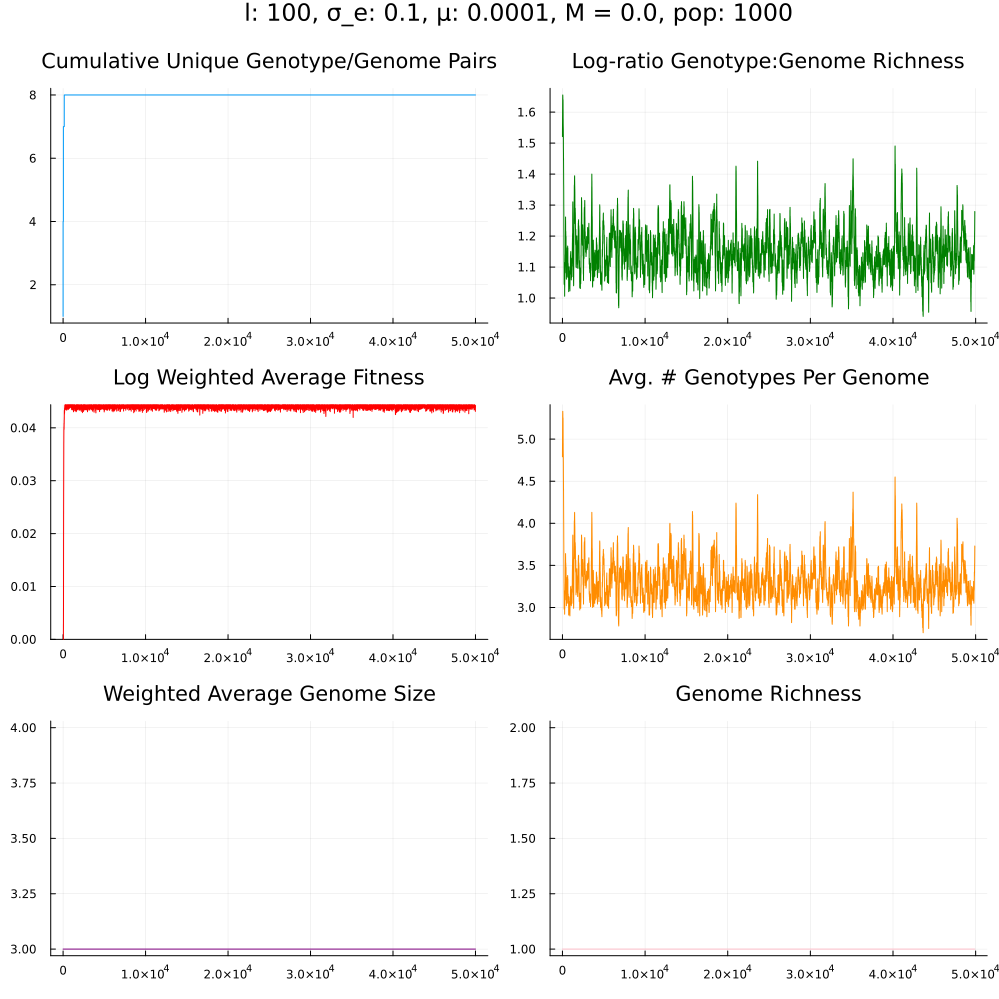

In [12]:
loci = 100
init_active_loci = 3
max_init_genotype_bits = 1
total_population = 1000
σ_epi::Float64 = 0.1
μ = (total_population^-1)/10
M = 0.0#μ * 10^-2
simulation_length = 50000
i = 1
#for init_active_loci in (1,10,20)
rng_default, rng_additive, rng_init_genotype, rng_init_genome, rng_mutation = initialize_prngs(genome_seed = i, mutation_seed = i)
additive_effects = zeros(128)
df_genotypes = simulate(loci, init_active_loci, max_init_genotype_bits, total_population, σ_epi, μ, M, simulation_length, rng_init_genome, rng_init_genotype, rng_default, rng_mutation, additive_effects)
generate_plots(df_genotypes, μ, M, additive_effects, σ_epi, save = false)
#output_data = process_data(df_genotypes, μ, M, additive_effects, σ_epi)[7]
#insertcols!(df, string(init_active_loci) => output_data[!,:AverageGenomeSize])
#final_fitness = get_fitness(output_data[!,:Genotype][end], output_data[!,:Genome][end], additive_effects, σ_epi)
#max_fitness = exp(sum(heaviside.(additive_effects[1:loci]) .* additive_effects[1:loci]))
#end
#CSV.write("output/additive_replicate124_data_20250724.csv", df)

In [7]:
# From Suman:
add = 0
epi = 1
L = 10
expected_max = exp((2 * L * (((L / 2) * add^2) + epi^2) * log(2))^0.5)

41.40068435708576

In [13]:
expected_searchtime(97, 100)

(7.744401803863507e9, 4.8844507918499446e8)